In [52]:
import sys

sys.path.append("../")
from library.datasets import LungCancerDataset
from library.train import create_dataloader
from entrypoint import lung_scoring_function
import matplotlib.pyplot as plt
import torch
from library.models import *
import random
import glob
from icecream import ic
import copy
import pprint
import pandas as pd
from tqdm.auto import tqdm

In [2]:
best_lung_models_combined = [i for i in glob.glob('../lung_training/**/*Model.pt', recursive=True)]

In [3]:
lung_dir = "../datasets/train_lung/"
random_seed = 42024
number_of_buckets = 400
months_per_gt_bucket=0.5

val_dataset = LungCancerDataset(
    lung_dir,
    split_type="val",
    random_seed=random_seed,
    number_of_buckets=number_of_buckets,
    months_per_gt_bucket = months_per_gt_bucket
)
test_dataset = LungCancerDataset(
    lung_dir, split_type="test", random_seed=random_seed, number_of_buckets=number_of_buckets, months_per_gt_bucket = months_per_gt_bucket
)

Adding raw case data to ChaimeleonDataset:   0%|          | 0/320 [00:00<?, ?it/s]

Preparing val dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Adding raw case data to ChaimeleonDataset:   0%|          | 0/320 [00:00<?, ?it/s]

Preparing test dataset:   0%|          | 0/48 [00:00<?, ?it/s]

In [4]:
val_loader = create_dataloader(val_dataset, batch_size=6, shuffle=False)
test_loader = create_dataloader(test_dataset, batch_size=6, shuffle=False)

In [64]:
path_to_model = {
    "LungCombinedModel.pt": LungCombinedModel(number_of_buckets=number_of_buckets),
    "LungCombinedResnet18PretrainedModel.pt": LungCombinedResnet18PretrainedModel(number_of_buckets=number_of_buckets),
}
test_path = '../lung_training/metadata_augmentation/LungCombinedResnet18PretrainedModel/2023-12-13_17-44-00/400_buckets_0.5_months/[]/0.003_starting_lr/best_val_score_LungCombinedResnet18PretrainedModel.pt'
lung_model_base = path_to_model[test_path.split('_')[-1]]

In [65]:
# load model
model_state_dict = torch.load(test_path)
model = copy.deepcopy(lung_model_base)
model.load_state_dict(model_state_dict)
model = model.eval()

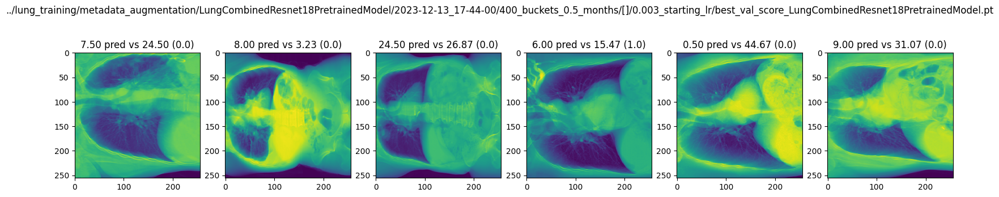

In [68]:
# Prostate models loop
epoch_targets = []
epoch_preds = []
epoch_outputs = []
for batch_idx, (images, metadata, targets) in enumerate(val_loader):
    data = images, metadata.squeeze()
    if isinstance(targets, list):
        pfs = targets[1]
        targets = targets[0]
    else:
        targets = targets
    output = model(data)
    pred = output.argmax(dim=1, keepdim=True)
    
    estimates = torch.nn.functional.softmax(output, dim=1)
    epoch_preds.extend([i.item() for i in pred])
    epoch_outputs.extend([i for i in estimates])
    epoch_targets.extend(pfs)
fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(20,4))
for ind in range(images.shape[0]):
    ax[ind].imshow(images[ind][4])
    ax[ind].set_title(f"{pred[ind].item()*months_per_gt_bucket:0.2f} pred vs {pfs[ind][1]:0.2f} ({pfs[ind][0]})")
fig.suptitle(test_path)
score = lung_scoring_function(months_per_gt_bucket, epoch_targets, epoch_preds)

In [67]:
pprint.pprint(test_path)
pprint.pprint(score)

'../lung_training/metadata_augmentation/LungCombinedResnet18PretrainedModel/2023-12-13_17-44-00/400_buckets_0.5_months/[]/0.003_starting_lr/best_val_score_LungCombinedResnet18PretrainedModel.pt'
0.7305605786618445


In [37]:
def load_saved_model(model_path, path_to_model):
    model_base = path_to_model[model_path.split('_')[-1]]
    model_state_dict = torch.load(model_path)
    model = copy.deepcopy(model_base)
    model.load_state_dict(model_state_dict)
    model = model.eval()

    return model

In [62]:
def evaluate_lung_model(eval_dataloader, model_path, path_to_model, verbose=False, visualize = False, eval_id = None):
    model = load_saved_model(model_path, path_to_model)
    
    epoch_targets = []
    epoch_preds = []
    epoch_outputs = []
    for batch_idx, (images, metadata, targets) in enumerate(eval_dataloader):
        data = images, metadata.squeeze()
        if isinstance(targets, list):
            pfs = targets[1]
            targets = targets[0]
        else:
            targets = targets
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        
        estimates = torch.nn.functional.softmax(output, dim=1)
        epoch_preds.extend([i.item() for i in pred])
        epoch_outputs.extend([i for i in estimates])
        epoch_targets.extend(pfs)
    
    score = lung_scoring_function(months_per_gt_bucket, epoch_targets, epoch_preds)
    if eval_id is not None:
        score_dict = {f'{eval_id}_c_index': score}
    else:
        score_dict = {'c_index': score}

    model_details = model_path.split('/')[2:]

    if verbose:
        pprint.pprint(model_details)
        pprint.pprint(score_dict)
        print("\n\n")

    if visualize and score > 0.625:
        fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(20,5))
        for ind in range(images.shape[0]):
            ax[ind].imshow(images[ind][4])
            ax[ind].set_title(f"{pred[ind].item()*months_per_gt_bucket:0.2f} pred vs {pfs[ind][1]:0.2f} actual")
        fig.suptitle(f"{model_path} - {score:0.4f}")
    return score_dict

In [53]:
val_results = {}
for model_path in tqdm(best_lung_models_combined):
    results = evaluate_lung_model(val_loader, model_path, path_to_model, eval_id = 'val')
    val_results[model_path] = results

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fd8fd0efc70>
Traceback (most recent call last):
  File "/home/jordan/github/chaimeleon_open_challenges_rcjh/venv/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/home/jordan/github/chaimeleon_open_challenges_rcjh/venv/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1436, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


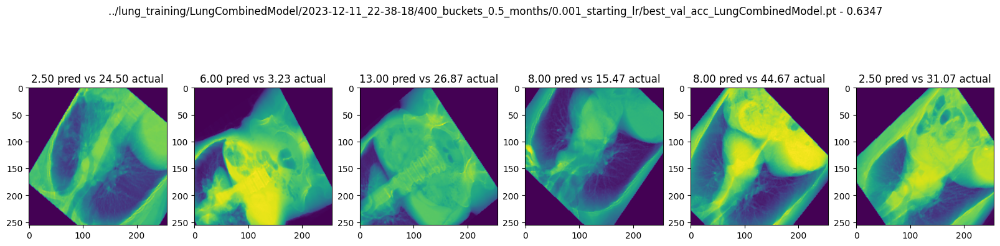

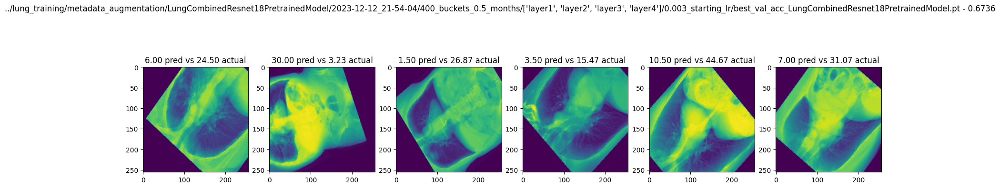

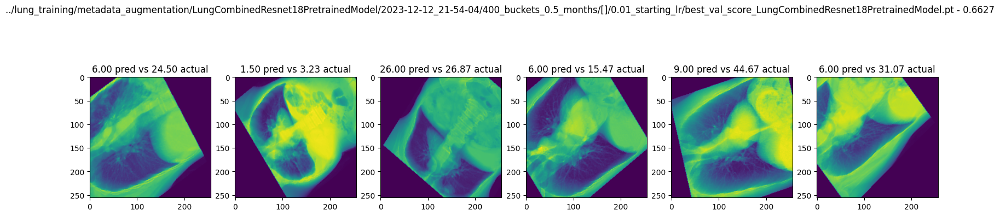

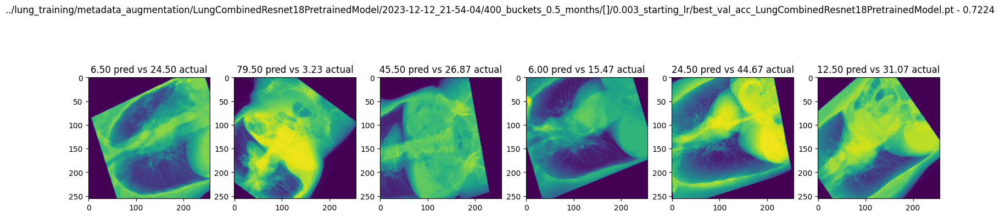

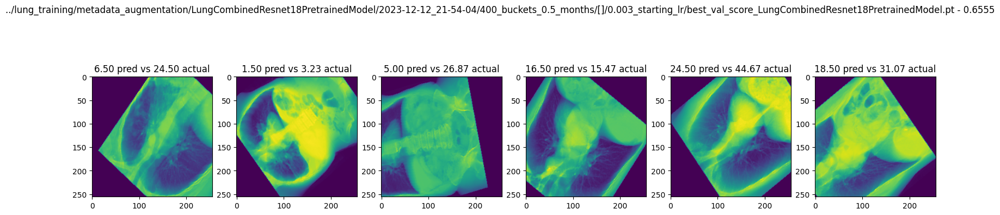

...

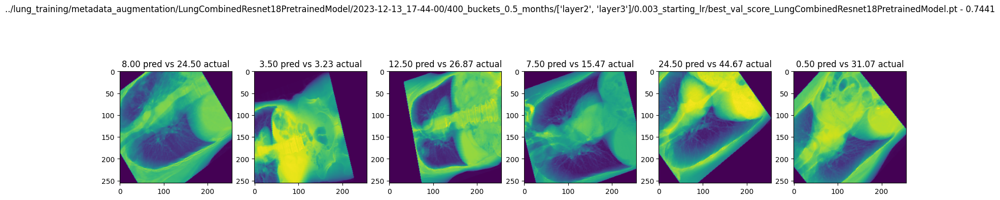

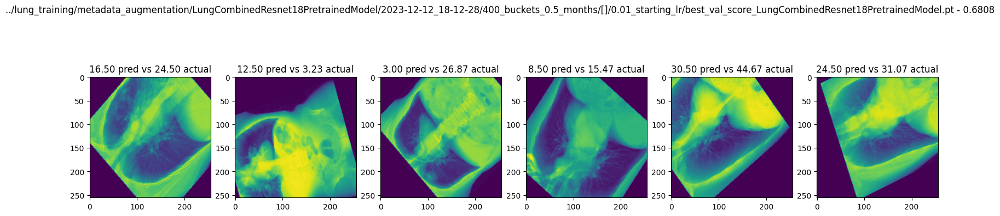

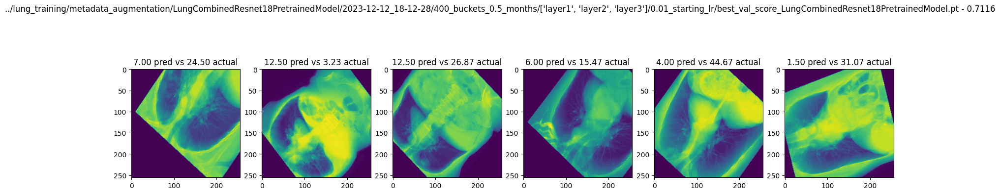

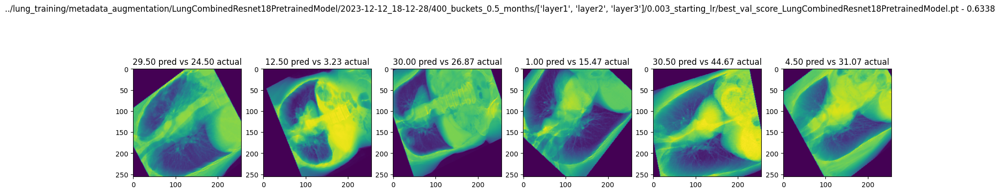

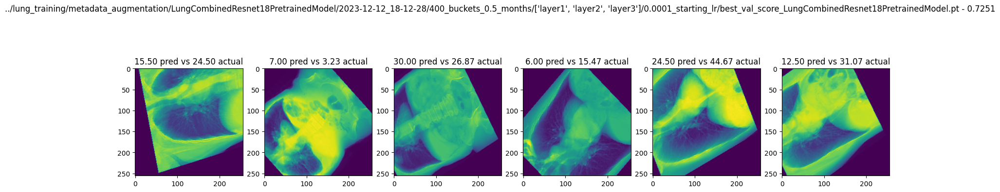

In [63]:
test_results = {}
for model_path in tqdm(best_lung_models_combined):
    results = evaluate_lung_model(test_loader, model_path, path_to_model, visualize=True, eval_id = 'test')
    test_results[model_path] = results

In [55]:
val_df = pd.DataFrame.from_dict(val_results, orient='index')
test_df = pd.DataFrame.from_dict(test_results, orient='index')

In [56]:
val_df

,val_c_index
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.0001_starting_lr/best_val_score_LungCombinedModel.pt,0.691682
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.001_starting_lr/best_val_acc_LungCombinedModel.pt,0.603978
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.001_starting_lr/best_val_score_LungCombinedModel.pt,0.626582
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.003_starting_lr/best_val_acc_LungCombinedModel.pt,0.500000
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.003_starting_lr/best_val_score_LungCombinedModel.pt,0.721519
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.0001_starting_lr/best_val_acc_LungCombinedModel.pt,0.425859
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.0001_starting_lr/best_val_score_LungCombinedModel.pt,0.576854
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.001_starting_lr/best_val_acc_LungCombinedModel.pt,0.451175
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.001_starting_lr/best_val_score_LungCombinedModel.pt,0.669982
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.003_starting_lr/best_val_acc_LungCombinedModel.pt,0.544304


In [57]:
test_df

,test_c_index
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.0001_starting_lr/best_val_score_LungCombinedModel.pt,0.270344
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.001_starting_lr/best_val_acc_LungCombinedModel.pt,0.652803
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.001_starting_lr/best_val_score_LungCombinedModel.pt,0.563291
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.003_starting_lr/best_val_acc_LungCombinedModel.pt,0.485533
../lung_training/LungCombinedModel/2023-12-11_22-38-18/400_buckets_0.5_months/0.003_starting_lr/best_val_score_LungCombinedModel.pt,0.393309
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.0001_starting_lr/best_val_acc_LungCombinedModel.pt,0.535262
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.0001_starting_lr/best_val_score_LungCombinedModel.pt,0.565099
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.001_starting_lr/best_val_acc_LungCombinedModel.pt,0.404159
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.001_starting_lr/best_val_score_LungCombinedModel.pt,0.413201
../lung_training/metadata_augmentation/LungCombinedModel/2023-12-11_23-55-30/400_buckets_0.5_months/0.003_starting_lr/best_val_acc_LungCombinedModel.pt,0.606691


In [59]:
results_df = pd.merge(val_df, test_df, left_index=True, right_index=True)

In [60]:
results_df.to_csv('./2023_12_16_lung_eval_results.csv')

In [61]:
results_df.to_excel('./2023_12_17_lung_eval_results.xlsx', sheet_name='eval_results')